#***Impoing the libraries***

In [ ]:
# pip install tensorflow

In [ ]:
import pandas as pd
#import torch
import numpy as np
import sqlite3
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import warnings
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


#***Importing The Data***

In [ ]:
df = pd.read_csv('/content/gdrive/MyDrive/Sentiment Analysis/covid19_tweets.csv')

df.info()
covid_data = df[['text']].copy()
covid_data.head()
covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179108 entries, 0 to 179107
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         179108 non-null  object
 1   user_location     142337 non-null  object
 2   user_description  168822 non-null  object
 3   user_created      179108 non-null  object
 4   user_followers    179108 non-null  int64 
 5   user_friends      179108 non-null  int64 
 6   user_favourites   179108 non-null  int64 
 7   user_verified     179108 non-null  bool  
 8   date              179108 non-null  object
 9   text              179108 non-null  object
 10  hashtags          127774 non-null  object
 11  source            179031 non-null  object
 12  is_retweet        179108 non-null  bool  
dtypes: bool(2), int64(3), object(8)
memory usage: 15.4+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179108 entries, 0 to 179107
Data columns (total 1 columns):
 #   Column  N

#***Data Preprocessing***

In [ ]:
import re


def remove_url(text):
    text = re.sub(r"http\S+", "", text)
    return text


# Example string with weird font characters plus an URL which we gonna remove.
sample = "ℍ𝕚 𝔼𝕧𝕖𝕣𝕪𝕠𝕟𝕖 https://www.kaggle.com 𝕀 𝕒𝕞 😊 𝕥𝕠 𝕔𝕣𝕖𝕒𝕥𝕖 𝕥𝕙𝕚𝕤 𝕟𝕠𝕥𝕖𝕓𝕠𝕠𝕜"
print(f"Text before removing url:- \n {sample}")

sample = remove_url(sample)
print(f"Text after removing url:- \n {sample}")

Text before removing url:- 
 ℍ𝕚 𝔼𝕧𝕖𝕣𝕪𝕠𝕟𝕖 https://www.kaggle.com 𝕀 𝕒𝕞 😊 𝕥𝕠 𝕔𝕣𝕖𝕒𝕥𝕖 𝕥𝕙𝕚𝕤 𝕟𝕠𝕥𝕖𝕓𝕠𝕠𝕜
Text after removing url:- 
 ℍ𝕚 𝔼𝕧𝕖𝕣𝕪𝕠𝕟𝕖  𝕀 𝕒𝕞 😊 𝕥𝕠 𝕔𝕣𝕖𝕒𝕥𝕖 𝕥𝕙𝕚𝕤 𝕟𝕠𝕥𝕖𝕓𝕠𝕠𝕜


In [ ]:
import unicodedata as uni

print(f"Text before Unicode Normalization:- \n {sample}")

sample = uni.normalize('NFKD', sample)
print(f"Text after Unicode Normalization:- \n {sample}")

Text before Unicode Normalization:- 
 ℍ𝕚 𝔼𝕧𝕖𝕣𝕪𝕠𝕟𝕖  𝕀 𝕒𝕞 😊 𝕥𝕠 𝕔𝕣𝕖𝕒𝕥𝕖 𝕥𝕙𝕚𝕤 𝕟𝕠𝕥𝕖𝕓𝕠𝕠𝕜
Text after Unicode Normalization:- 
 Hi Everyone  I am 😊 to create this notebook


In [ ]:
!pip install demoji

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 1.1 MB/s 


In [ ]:
import demoji


def handle_emoji(string):
    emojis = demoji.findall(string)

    for emoji in emojis:
        string = string.replace(emoji, " " + emojis[emoji].split(":")[0])

    return string


print(f"Before Handling emoji:- \n {sample}")
print(f"After Handling emoji:- \n {handle_emoji(sample)}")

Before Handling emoji:- 
 Hi Everyone  I am 😊 to create this notebook
After Handling emoji:- 
 Hi Everyone  I am  smiling face with smiling eyes to create this notebook


In [ ]:
def word_tokenizer(text):
    text = text.lower()
    text = text.split()

    return text


sample = "Hi Everyone I am Nilankan Banerjee"
print(sample)
print(word_tokenizer(sample))

Hi Everyone I am Nilankan Banerjee
['hi', 'everyone', 'i', 'am', 'nilankan', 'banerjee']


In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')

en_stopwords = set(stopwords.words('english'))
print(f"Stop Words in English : \n{ en_stopwords}")

Stop Words in English : 
{'itself', 'own', 'y', 'herself', 'what', 'why', "doesn't", 'this', "mustn't", 'between', 'your', 'have', 'm', 'were', 'shan', "hasn't", 'very', 'the', 'being', 'from', 'weren', 'wouldn', 'into', 'or', 'below', "aren't", 'during', "it's", 'didn', 'mightn', 'does', 'these', 'there', 'i', "didn't", "you'll", 'not', 'some', 'has', "should've", 'mustn', 'is', 'had', 'having', 'it', "shan't", 't', 'should', 'about', 'needn', 'been', 'them', 'if', 'isn', 'who', 'did', 'than', "won't", 'only', "mightn't", 'at', 'won', 'again', 'doesn', 'which', 'each', 'she', 'their', 'that', 'after', "you've", 'will', 'all', 'was', 'both', 'same', 'hasn', "shouldn't", 'with', 'aren', 'hers', 'our', 'before', 'they', 'once', 'theirs', 'off', 'are', 'on', 'but', 'just', 'few', 'd', 'against', 'when', 'my', 'ourselves', 'then', 'now', 'further', 'for', 'how', 'ours', 'up', 'nor', 'he', "she's", 'll', 'to', 'a', 'other', 'we', 'themselves', 'any', 'ain', 'by', 'me', 'while', 'ma', "could

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def remove_stopwords(text):
    text = [word for word in text if word not in en_stopwords]
    return text

In [ ]:
def remove_stopwords(text):
    text = [word for word in text if word not in en_stopwords]
    return text


print(f"Before removing stopwords : {word_tokenizer(sample)}")
print(f"After removing stopwords : {remove_stopwords(word_tokenizer(sample))}")

Before removing stopwords : ['hi', 'everyone', 'i', 'am', 'nilankan', 'banerjee']
After removing stopwords : ['hi', 'everyone', 'nilankan', 'banerjee']


In [ ]:
from nltk.stem.porter import PorterStemmer
from nltk.stem.lancaster import LancasterStemmer

stemmer = PorterStemmer()
# stemmer = LancasterStemmer()


def stemming(text):

    text = [stemmer.stem(word) for word in text]
    return text


sample = "This is our Sentiment Analysis Project"
print(f"Before Stemming : {(sample)}")
print(f"After Stemming : {stemming(word_tokenizer(sample))}")
from nltk.stem.porter import PorterStemmer
from nltk.stem.lancaster import LancasterStemmer

stemmer = PorterStemmer()
# stemmer = LancasterStemmer()


def stemming(text):

    text = [stemmer.stem(word) for word in text]
    return text


sample = "This is for Stemming and lemmatization"
print(f"Before Stemming : {(sample)}")
print(f"After Stemming : {stemming(word_tokenizer(sample))}")

Before Stemming : This is our Sentiment Analysis Project
After Stemming : ['thi', 'is', 'our', 'sentiment', 'analysi', 'project']
Before Stemming : This is for Stemming and lemmatization
After Stemming : ['thi', 'is', 'for', 'stem', 'and', 'lemmat']


In [ ]:
import spacy

sp = spacy.load("en_core_web_sm")

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [ ]:
def lemmatization(text):

    # text = [sp(word).lemma_ for word in text]

    text = " ".join(text)
    token = sp(text)

    text = [word.lemma_ for word in token]
    return text


print(f"Before Lemmatization : {word_tokenizer(sample)}")
print(f"After Lemmatization : {lemmatization(word_tokenizer(sample))}")

Before Lemmatization : ['this', 'is', 'for', 'stemming', 'and', 'lemmatization']
After Lemmatization : ['this', 'be', 'for', 'stemming', 'and', 'lemmatization']


In [ ]:
def preprocessing(text):
    
    text = remove_url(text) 
    text = uni.normalize('NFKD', text)
    text = handle_emoji(text)
    text = text.lower() 
    text = re.sub(r'[^\w\s]', '', text)
    text = word_tokenizer(text)
    # text = stemming(text)
    text = lemmatization(text)
    text = remove_stopwords(text)
    text = " ".join(text)

    return text

In [ ]:
from tqdm import tqdm

tqdm.pandas()

covid_data['review'] = covid_data['text'].progress_map(preprocessing)

100%|██████████| 179108/179108 [29:54<00:00, 99.80it/s] 


In [ ]:
covid_data.head()

,text,review
0,If I smelled the scent of hand sanitizers toda...,I smell scent hand sanitizer today someone pas...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,hey yankee yankeespr mlb would make sense play...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,diane3443 wdunlap realdonaldtrump trump never ...
3,@brookbanktv The one gift #COVID19 has give me...,brookbanktv one gift covid19 give I appreciati...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 july medium bulletin novel coronavirusupdat...


#***LDA Algorithm***

In [ ]:
reviews = covid_data.review.values.tolist()


In [ ]:
from tqdm import tqdm

tqdm.pandas()

covid_data['clean_review'] = covid_data['review'].progress_map(word_tokenizer)

100%|██████████| 179108/179108 [00:00<00:00, 217876.13it/s]


In [ ]:
covid_data.head()

,text,review,clean_review
0,If I smelled the scent of hand sanitizers toda...,I smell scent hand sanitizer today someone pas...,"[i, smell, scent, hand, sanitizer, today, some..."
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,hey yankee yankeespr mlb would make sense play...,"[hey, yankee, yankeespr, mlb, would, make, sen..."
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,diane3443 wdunlap realdonaldtrump trump never ...,"[diane3443, wdunlap, realdonaldtrump, trump, n..."
3,@brookbanktv The one gift #COVID19 has give me...,brookbanktv one gift covid19 give I appreciati...,"[brookbanktv, one, gift, covid19, give, i, app..."
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 july medium bulletin novel coronavirusupdat...,"[25, july, medium, bulletin, novel, coronaviru..."


In [ ]:
data_words =covid_data['clean_review'].values.tolist()
len(data_words)

179108

In [ ]:
import gensim.corpora as corpora

# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 2), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1)]


In [ ]:
from gensim.models import LdaMulticore
from gensim.models import LdaModel
from pprint import pprint

# number of topics
num_topics = 100
# Build LDA model
lda_model = LdaMulticore(corpus=corpus, id2word=id2word, num_topics=num_topics, iterations=400)
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


[(42,
  '0.157*"may" + 0.092*"coffin" + 0.048*"florida" + 0.037*"covid19" + '
  '0.034*"nurse" + 0.032*"york" + 0.026*"special" + 0.020*"train" + '
  '0.019*"warning" + 0.017*"beautiful"'),
 (35,
  '0.114*"china" + 0.063*"thousand" + 0.049*"stand" + 0.046*"large" + '
  '0.043*"release" + 0.040*"covid19" + 0.034*"resource" + 0.032*"manage" + '
  '0.031*"blame" + 0.031*"berlin"'),
 (5,
  '0.096*"covid19" + 0.045*"require" + 0.043*"round" + 0.042*"figure" + '
  '0.041*"status" + 0.036*"indiafightscorona" + 0.036*"course" + '
  '0.025*"learning" + 0.023*"movie" + 0.022*"professional"'),
 (85,
  '0.077*"hope" + 0.071*"could" + 0.069*"without" + 0.062*"healthcare" + '
  '0.053*"covid19" + 0.051*"problem" + 0.034*"cure" + 0.029*"instead" + '
  '0.025*"war" + 0.025*"citizen"'),
 (8,
  '0.145*"county" + 0.134*"dr" + 0.081*"reach" + 0.042*"shop" + 0.034*"ahead" '
  '+ 0.031*"mandatory" + 0.030*"gather" + 0.023*"thursday" + 0.022*"emerge" + '
  '0.018*"covid19"'),
 (18,
  '0.122*"covid19" + 0.120

# **Fasttext Model**

In [ ]:
# %%time
from gensim.models import FastText

fasttext_model = FastText(data_words, size= 100, window=5, min_count=5, workers=4,sg=1)

In [ ]:
fasttext_model.save("FastText-Model-For-ABSA.bin")

In [ ]:
fasttext_model.wv.similarity('vaccine','medicine')

0.5646097

In [ ]:
aspects = ["vaccine","education","job"]

def get_similarity(text, aspect):
    try:
        text = " ".join(text)
        return fasttext_model.wv.similarity(text, aspect)
    except:
        return 0


In [ ]:
from tqdm import tqdm
tqdm.pandas()
for aspect in aspects:
    covid_data[aspect] = covid_data['clean_review'].progress_map(lambda text: get_similarity(text, aspect))

100%|██████████| 179108/179108 [01:26<00:00, 2080.39it/s]


In [ ]:

# covid_data.drop(covid_data.columns[[2,3,4]], axis=1,inplace=True)
covid_data.head()

,text,review,clean_review,vaccine,education,job
0,If I smelled the scent of hand sanitizers toda...,I smell scent hand sanitizer today someone pas...,"[i, smell, scent, hand, sanitizer, today, some...",0.465351,0.448480,0.463131
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,hey yankee yankeespr mlb would make sense play...,"[hey, yankee, yankeespr, mlb, would, make, sen...",0.349901,0.435276,0.447893
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,diane3443 wdunlap realdonaldtrump trump never ...,"[diane3443, wdunlap, realdonaldtrump, trump, n...",0.363032,0.274736,0.466030
3,@brookbanktv The one gift #COVID19 has give me...,brookbanktv one gift covid19 give I appreciati...,"[brookbanktv, one, gift, covid19, give, i, app...",0.419070,0.533835,0.453676
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 july medium bulletin novel coronavirusupdat...,"[25, july, medium, bulletin, novel, coronaviru...",0.386576,0.243509,0.274348


In [ ]:
covid_data.to_csv("seniment_analysis.csv", index = False)

In [ ]:
def que(x):
    if x['job'] >= x['education'] and x['job'] >= x['vaccine']:
        return 'job'
    elif x['education'] >= x['job'] and x['education'] >= x['vaccine']:
        return 'education'
    else: # x['vaccine'] >= x['job'] and x['vaccine'] <= x['education']:
        return 'vaccine'
    return ''
covid_data['aspect'] = covid_data.apply(que, axis=1)

In [ ]:
covid_data.head(10)

,text,review,clean_review,vaccine,education,job,aspect
0,If I smelled the scent of hand sanitizers toda...,I smell scent hand sanitizer today someone pas...,"[i, smell, scent, hand, sanitizer, today, some...",0.465351,0.448480,0.463131,vaccine
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,hey yankee yankeespr mlb would make sense play...,"[hey, yankee, yankeespr, mlb, would, make, sen...",0.349901,0.435276,0.447893,job
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,diane3443 wdunlap realdonaldtrump trump never ...,"[diane3443, wdunlap, realdonaldtrump, trump, n...",0.363032,0.274736,0.466030,job
3,@brookbanktv The one gift #COVID19 has give me...,brookbanktv one gift covid19 give I appreciati...,"[brookbanktv, one, gift, covid19, give, i, app...",0.419070,0.533835,0.453676,education
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 july medium bulletin novel coronavirusupdat...,"[25, july, medium, bulletin, novel, coronaviru...",0.386576,0.243509,0.274348,vaccine
5,#coronavirus #covid19 deaths continue to rise....,coronavirus covid19 death continue rise almost...,"[coronavirus, covid19, death, continue, rise, ...",0.440063,0.401471,0.397796,vaccine
6,How #COVID19 Will Change Work in General (and ...,covid19 change work general recruit specifical...,"[covid19, change, work, general, recruit, spec...",0.456916,0.582728,0.474048,education
7,You now have to wear face coverings when out s...,wear face covering shopping include visit loca...,"[wear, face, covering, shopping, include, visi...",0.468937,0.460119,0.350953,vaccine
8,Praying for good health and recovery of @Chouh...,pray good health recovery chouhanshivraj covid...,"[pray, good, health, recovery, chouhanshivraj,...",0.388587,0.317382,0.288307,vaccine
9,POPE AS GOD - Prophet Sadhu Sundar Selvaraj. W...,pope god prophet sadhu sundar selvaraj watch h...,"[pope, god, prophet, sadhu, sundar, selvaraj, ...",0.392243,0.451852,0.423840,education


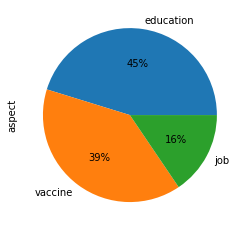

In [ ]:
covid_data['aspect'].value_counts().plot(kind='pie',autopct='%1.0f%%')


# **not working**

In [ ]:
nltk.download('punkt')
corpus = []
for text in covid_data['clean_review']:
  # words = [word.lower() for word in word_tokenize(text) ]
  corpus.append(text)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
num_of_words = len(corpus)
print(num_of_words)

179108


In [ ]:
covid_data.head()

,text,review,clean_review,vaccine,education,job,aspect
0,If I smelled the scent of hand sanitizers toda...,I smell scent hand sanitizer today someone pas...,"[i, smell, scent, hand, sanitizer, today, some...",0.465351,0.448480,0.463131,vaccine
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,hey yankee yankeespr mlb would make sense play...,"[hey, yankee, yankeespr, mlb, would, make, sen...",0.349901,0.435276,0.447893,job
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,diane3443 wdunlap realdonaldtrump trump never ...,"[diane3443, wdunlap, realdonaldtrump, trump, n...",0.363032,0.274736,0.466030,job
3,@brookbanktv The one gift #COVID19 has give me...,brookbanktv one gift covid19 give I appreciati...,"[brookbanktv, one, gift, covid19, give, i, app...",0.419070,0.533835,0.453676,education
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 july medium bulletin novel coronavirusupdat...,"[25, july, medium, bulletin, novel, coronaviru...",0.386576,0.243509,0.274348,vaccine


# **Sentiment Score**

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sent = SentimentIntensityAnalyzer()
#df = pd.read_csv('', usecols = ['text'])
polarity = [round(sent.polarity_scores(i)['compound'], 2) for i in covid_data['review']]
covid_data['sentiment_score'] = polarity
covid_data.head(10)

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


# **Sentiments Based on the Aspects**

In [ ]:
# count each sentiment for each aspect
countList=[0,0,0,0,0,0,0,0,0]

def que0(x):
    if x['education'] >= x['job'] and x['education'] >= x['vaccine']:
        if x['sentiment_score'] > 0:
          countList[0] +=1
        elif x['sentiment_score'] < 0:
          countList[1] +=1
        else:
          countList[2] +=1
    elif x['vaccine'] >= x['job'] and x['vaccine'] >= x['education']:
        if x['sentiment_score'] > 0:
          countList[3] +=1
        elif x['sentiment_score'] < 0:
          countList[4] +=1
        else:
          countList[5] +=1
    else : #x['vaccine'] >= x['job'] and x['vaccine'] >= x['education']:
        if x['sentiment_score'] > 0:
            countList[6] +=1
        elif x['sentiment_score'] < 0:
            countList[7] +=1
        else:
            countList[8] +=1
    return ''
#covid_data['aspect_sentiment'] = covid_data.apply(que0, axis=1)
covid_data.apply(que0, axis=1)
print(countList)

In [ ]:
# Example Python program to plot a complex bar chart 

import pandas as pd

import matplotlib.pyplot as plot

 

# A python dictionary

data = {"Positive":[countList[0], countList[3], countList[6]],

        "Negative":[countList[1], countList[4], countList[7]],
        "Neutral":[countList[2], countList[5], countList[8]]

        };

index     = ["Education", "Vaccine", "Job"];

 

# Dictionary loaded into a DataFrame       

dataFrame = pd.DataFrame(data=data, index=index);

 

# Draw a vertical bar chart

dataFrame.plot.bar(rot=15, title=" Graph for Sentiment comparision of each Aspect ");

plot.show(block=True);

# **Sentiment Labels**

In [ ]:
my_list = []
for score in covid_data['sentiment_score']:
  if score > 0:
    my_list.append('Positive')

  elif score < 0:
    my_list.append('Negative')
  else:
    my_list.append('Neutral')
#print(my_list)
covid_data['sentiment']=my_list
covid_data.head(10)

# **Models**

# **Naive bayes**

In [ ]:
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'sentiment'.
covid_data['label']= label_encoder.fit_transform(covid_data['sentiment'])
  
covid_data['label']

In [ ]:
import sklearn
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
bow_vectorizer = CountVectorizer(max_df=0.90,min_df=2,max_features=1000,stop_words='english')
Bow = bow_vectorizer.fit_transform(covid_data['review'])

In [ ]:
Bow.shape

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(Bow,covid_data['label'],test_size=0.2,random_state=60)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
model_naive = MultinomialNB().fit(X_train,y_train)
predicted_naive = model_naive.predict(X_test)
from sklearn.metrics import accuracy_score
accuracy_score(predicted_naive,y_test)

In [ ]:
from sklearn import metrics
print(metrics.classification_report(y_test,predicted_naive))

# **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
model_lr = LogisticRegression(penalty='l2',max_iter=500,C=1,random_state=42)
model_lr.fit(X_train,y_train)

In [ ]:
predicted_lr = model_lr.predict(X_test)
accuracy_score(predicted_lr,y_test)

In [ ]:
from sklearn.metrics import precision_recall_curve

print(metrics.classification_report(y_test,predicted_lr))

In [ ]:
print(metrics.precision_score(y_test,predicted_lr,average='macro'))


# **Bi-LSTM**

In [ ]:
from pandas.core.reshape.reshape import get_dummies
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
import keras
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
import math
reviews = covid_data['clean_review'].values
labels = covid_data['sentiment'].values
encoder = LabelEncoder()
encoded_labels = get_dummies(encoder.fit_transform(labels))

In [ ]:
lstm_df = covid_data[['review','sentiment']]

In [ ]:
lstm_df.head(10)

In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.metrics import Precision, Recall
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras import datasets

from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras import losses



In [ ]:
lstm_df = lstm_df.dropna()

In [ ]:
lstm_df.head()

In [ ]:
lstm_df.shape

In [ ]:
lstm_df = lstm_df.reset_index(drop=True)
REPLACE = re.compile('[/(){}\[\]\@,;]')
SYMBOL = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('english'))

def cleaning(text):
  text = text.lower()
  text = REPLACE.sub('',text)
  text = SYMBOL.sub('',text)
  text = text.replace('x', '')
  text = ' '.join(word for word in text.split() if word not in STOPWORDS )
  return text
lstm_df['review'] = lstm_df['review'].apply(cleaning)

In [ ]:
lstm_df['review']

0         smell scent hand sanitizer today someone past ...
1         hey yankee yankeespr mlb would make sense play...
2         diane3443 wdunlap realdonaldtrump trump never ...
3         brookbanktv one gift covid19 give appreciation...
4         25 july medium bulletin novel coronavirusupdat...
5         coronavirus covid19 death continue rise almost...
6         covid19 change work general recruit specifical...
7         wear face covering shopping include visit loca...
8         pray good health recovery chouhanshivraj covid...
9         pope god prophet sadhu sundar selvaraj watch h...
10        49k covid19 case still response cbseindia29 hr...
11        order logo graphicdesigner logodesign logodesi...
12        wave handpattyhajdu navdeepsbain one safe covi...
13        let protect covid19 real number climb fast con...
14        rajasthan government today start plasma bank s...
15        nagaland police covid19 awareness city tower j...
16        july 25 covid19 update tamilna

In [ ]:
MAX_NB_WORDS = 5000
max_len =100

EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words =MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(lstm_df['review'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))
     

Found 142768 unique tokens.


In [ ]:
X = tokenizer.texts_to_sequences(lstm_df['review'].values)
X = pad_sequences(X, maxlen=max_len)
print('Shape of data tensor:', X.shape)
X

Shape of data tensor: (179108, 100)


array([[   0,    0,    0, ...,  436,   74,   50],
       [   0,    0,    0, ...,  741,  241, 1290],
       [   0,    0,    0, ...,  852,  396,  522],
       ...,
       [   0,    0,    0, ...,   44,   18,  137],
       [   0,    0,    0, ...,  457, 1965,   46],
       [   0,    0,    0, ...,   33,  126,  211]], dtype=int32)

In [ ]:
Y = pd.get_dummies(lstm_df['sentiment'].values)
print('Shape of label tensor:', Y.shape)


Shape of label tensor: (179108, 3)


In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.10, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)


(161197, 100) (161197, 3)
(17911, 100) (17911, 3)


In [ ]:
# model = Sequential()
# model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
# model.add(SpatialDropout1D(0.2))
# model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
# model.add(Dense(4, activation='softmax'))
# model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# print(model.summary())

vocab_size = 5000
embedding_size = 32
epochs=20

learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
# Build model
model= Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=max_len))
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(32)))
model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax'))

In [ ]:
print(model.summary())

# Compile model
model.compile(loss='categorical_crossentropy', optimizer=sgd, 
               metrics=['accuracy', Precision(), Recall()])

# Train model

batch_size = 64
history = model.fit(X_train, Y_train,
                      validation_data=(X_test, Y_test),
                      batch_size=batch_size, epochs=5, verbose=1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 32)           160000    
                                                                 
 conv1d (Conv1D)             (None, 100, 32)           3104      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 50, 32)           0         
 )                                                               
                                                                 
 bidirectional (Bidirectiona  (None, 64)               16640     
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense (Dense)               (None, 3)                 1

In [ ]:
# epochs = 1
# batch_size = 128

#history = model.fit(X_train, Y_train, epochs=5, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])
#model.fit(x=X_train,y=Y_train,epochs=200,validation_data=(X_test,Y_test))  
#hist = model.fit(X_train, Y_train, batch_size=batch_size, epochs=5, validation_data=(X_test, Y_test)) 

In [ ]:
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))

560/560 [==============================] - 8s 13ms/step - loss: 0.2294 - accuracy: 0.9375 - precision: 0.9386 - recall: 0.9357
Test set
  Loss: 0.229
  Accuracy: 0.937


In [ ]:
lstm_Pred_model = model.predict(X_test)

In [ ]:
import keras.backend as K

def f1_score(precision, recall):
    ''' Function to calculate f1 score '''
    
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

# Evaluate model on the test set
loss, accuracy, precision, recall = model.evaluate(X_test, Y_test, verbose=0)
# Print metrics
print('')
print('Accuracy  : {:.4f}'.format(accuracy))
print('Precision : {:.4f}'.format(precision))
print('Recall    : {:.4f}'.format(recall))
print('F1 Score  : {:.4f}'.format(f1_score(precision, recall)))


Accuracy  : 0.9375
Precision : 0.9386
Recall    : 0.9357
F1 Score  : 0.9371


In [ ]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    # first plot
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Bi-LSTM Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
    # second plot
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Bi-LSTM Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')

In [ ]:
plot_training_hist(history)

In [ ]:
# Save the model architecture & the weights
model.save('best_model.h5')
print('Best model saved')

Best model saved


In [ ]:
import matplotlib.pyplot as plt

# line 1 points
x1 = [1,2,3]
y1 = [2,4,1]
# plotting the line 1 points
plt.plot(x1, y1, label = "line 1")

# line 2 points
x2 = [1,2,3]
y2 = [4,1,3]
# plotting the line 2 points
plt.plot(x2, y2, label = "line 2")
# line 2 points
x3 = [11,12,13]
y3 = [14,11,13]
# plotting the line 2 points 
plt.plot(x3, y3, label = "line 3")
# naming the x axis
plt.xlabel('x - axis')
# naming the y axis
plt.ylabel('y - axis')
# giving a title to my graph
plt.title('Two lines on same graph!')

# show a legend on the plot
plt.legend()

# function to show the plot
